In [4]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 28.2 MB/s eta 0:00:0000:01


In [5]:
!pip install supervision

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 181.5/181.5 kB 5.3 MB/s eta 0:00:00


In [ ]:
import warnings
warnings.filterwarnings('ignore')
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import yaml
import cv2
import supervision as sv
from ultralytics import YOLO
import copy
from pathlib import Path
import torch
import torch.nn as nn
from torchvision.models.feature_extraction import create_feature_extractor
from collections import OrderedDict
from torchvision.ops.feature_pyramid_network import FeaturePyramidNetwork
from torchvision.models.detection.anchor_utils import AnchorGenerator
import torchvision
import torch.optim as optim
from tqdm import tqdm
from torchvision.ops import nms
import torchvision.transforms as T
from torchvision.ops.boxes import box_iou
from torch.utils.data import DataLoader
import xml.etree.ElementTree as ET
import torchvision
import random
from PIL import Image
from collections import Counter
import torchvision.transforms.functional as F 
from collections import Counter
from IPython.display import Video

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


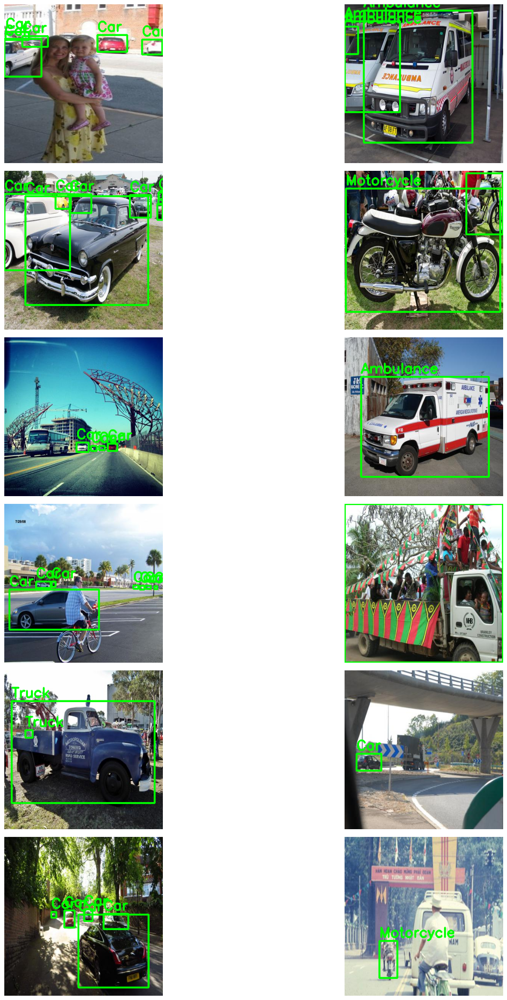

In [ ]:
base_path = Path('/kaggle/input/vehicledetection/VehiclesDetectionDataset')
train_images = base_path / 'train/images'
train_labels = base_path / 'train/labels'
class_names = ['Ambulance', 'Bus', 'Car', 'Motorcycle', 'Truck']

def JPG_Name_To_TXT(image_name):
    """Convert image filename to corresponding YOLO label filename."""
    return image_name.rsplit('.', 1)[0] + ".txt"

def get_image_dimensions(img_path):
    """Returns height and width of an image."""
    img = cv2.imread(str(img_path))
    return img.shape[:2]  # (height, width)

# Function to convert YOLO TXT annotation to bounding box coordinates
def TXT_To_BBOX(txt_path, img_height, img_width):
    """Reads YOLO format TXT and converts it to (x_min, y_min, x_max, y_max, class_id)."""
    bboxes = []
    with open(txt_path, "r") as f:
        for line in f:
            parts = line.strip().split()
            class_id = int(parts[0])
            x_center, y_center, width, height = map(float, parts[1:])

            # Convert YOLO format to pixel coordinates
            x_min = int((x_center - width / 2) * img_width)
            y_min = int((y_center - height / 2) * img_height)
            x_max = int((x_center + width / 2) * img_width)
            y_max = int((y_center + height / 2) * img_height)

            bboxes.append((x_min, y_min, x_max, y_max, class_id))
    return bboxes

def Plot_Random_Images():
    """Randomly selects images and plots them with their bounding boxes."""
    random_images = random.choices(list(train_images.iterdir()), k=12)

    plt.figure(figsize=(20, 30))  
    for i, img_path in enumerate(random_images, 1):
        plt.subplot(6, 2, i)  

        img = cv2.imread(str(img_path))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        txt_name = JPG_Name_To_TXT(img_path.name)
        lbl_path = train_labels / txt_name

        if lbl_path.exists():  
            img_height, img_width = get_image_dimensions(img_path)

            bboxes = TXT_To_BBOX(lbl_path, img_height, img_width)

            for (x_min, y_min, x_max, y_max, class_id) in bboxes:
                color = (0, 255, 0) 
                cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color, 3)
                cv2.putText(
                    img,
                    f"{class_names[class_id]}",
                    (x_min, y_min - 10),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    1.2,
                    color,
                    3
                )

        plt.imshow(img)
        plt.axis('off')  

    plt.subplots_adjust(wspace=0.05, hspace=0.05)  
    plt.show()

Plot_Random_Images()


In [ ]:
dataset_path = '/kaggle/input/vehicledetection/VehiclesDetectionDataset'

yaml_file_path = os.path.join(dataset_path, 'dataset.yaml')

with open(yaml_file_path, 'r') as file:
    yaml_content = yaml.load(file, Loader=yaml.FullLoader)
    print(yaml.dump(yaml_content, default_flow_style=False))


names:
- Ambulance
- Bus
- Car
- Motorcycle
- Truck
nc: 5
test: ../test/images
train: ../train/images
val: ../valid/images



In [9]:
train_images_path = os.path.join(dataset_path, 'train', 'images')
valid_images_path = os.path.join(dataset_path, 'valid', 'images')

num_train_images = 0
num_valid_images = 0

train_image_sizes = set()
valid_image_sizes = set()

for filename in os.listdir(train_images_path):
    if filename.endswith('.jpg'):  
        num_train_images += 1
        image_path = os.path.join(train_images_path, filename)
        with Image.open(image_path) as img:
            train_image_sizes.add(img.size)

for filename in os.listdir(valid_images_path):
    if filename.endswith('.jpg'): 
        num_valid_images += 1
        image_path = os.path.join(valid_images_path, filename)
        with Image.open(image_path) as img:
            valid_image_sizes.add(img.size)

print(f"Number of training images: {num_train_images}")
print(f"Number of validation images: {num_valid_images}")

if len(train_image_sizes) == 1:
    print(f"All training images have the same size: {train_image_sizes.pop()}")
else:
    print("Training images have varying sizes.")

if len(valid_image_sizes) == 1:
    print(f"All validation images have the same size: {valid_image_sizes.pop()}")
else:
    print("Validation images have varying sizes.")

Number of training images: 878
Number of validation images: 250
All training images have the same size: (416, 416)
All validation images have the same size: (416, 416)


## Обучение модели YOLOv8 (YOLOv8n)

Для задачи детекции объектов использовалась легковесная модель **YOLOv8n**, предоставляемая библиотекой Ultralytics.

### Параметры обучения:

- **Модель**: `YOLOv8n` (файл `yolo11n.pt`) — компактная версия YOLO, быстрая и подходящая для мобильных/встроенных систем.
- **Датасет**: загружается из YAML-файла (`dataset.yaml`), содержащего пути к train/val/test.
- **Количество эпох**: `50`
- **Размер изображений**: `416×416`
- **Batch size**: `32`
- **Оптимизатор**: автоматически подбирается (`optimizer='auto'`)
- **Начальная скорость обучения**: `lr0 = 0.001`, `lrf = 0.1` — нижний предел по косинусному графику.
- **Dropout**: `0.3` — регуляризация на стадии обучения.
- **Patience**: `150` — количество эпох без улучшения перед остановкой.
- **Устройство**: `device=0` — используется GPU.

> Модель обучается с использованием современных техник оптимизации, включая автоматический выбор оптимизатора и планировщика learning rate. Благодаря компактности `YOLOv8n`, обучение эффективно даже на ограниченных ресурсах.


In [ ]:
model = YOLO("yolo11n.pt")

100%|██████████| 5.35M/5.35M [00:00<00:00, 124MB/s]


In [11]:
results = model.train(
    data=yaml_file_path,     
    epochs=50,             
    imgsz=416,               
    device=0,                
    patience=150,             
    batch=32,                
    optimizer='auto',        
    lr0=0.001,              
    lrf=0.1,                
    dropout=0.3,            
    #freeze=20,              
    seed=0                  
)

Ultralytics 8.3.130 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/input/vehicledetection/VehiclesDetectionDataset/dataset.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.3, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=416, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.1, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=150, p

100%|██████████| 755k/755k [00:00<00:00, 25.0MB/s]


Overriding model.yaml nc=80 with nc=5

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /kaggle/input/vehicledetection/VehiclesDetectionDataset/train/labels... 878 images, 0 backgrounds, 0 corrupt: 100%|██████████| 878/878 [00:02<00:00, 323.25it/s]


WARNING ⚠️ train: Cache directory /kaggle/input/vehicledetection/VehiclesDetectionDataset/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.5±0.1 ms, read: 55.0±33.3 MB/s, size: 33.0 KB)


val: Scanning /kaggle/input/vehicledetection/VehiclesDetectionDataset/valid/labels... 250 images, 0 backgrounds, 0 corrupt: 100%|██████████| 250/250 [00:01<00:00, 225.52it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/vehicledetection/VehiclesDetectionDataset/valid is not writeable, cache not saved.


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 416 train, 416 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.19G      1.061      3.233       1.28         50        416: 100%|██████████| 28/28 [00:06<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.79it/s]

                   all        250        454    0.00455      0.827      0.257      0.192



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.41G      1.208      2.536      1.372         52        416: 100%|██████████| 28/28 [00:05<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.68it/s]

                   all        250        454      0.686     0.0957        0.3      0.198



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.41G      1.222      2.153      1.381         45        416: 100%|██████████| 28/28 [00:05<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.48it/s]

                   all        250        454      0.311      0.321      0.267      0.153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.41G      1.256      2.013      1.403         49        416: 100%|██████████| 28/28 [00:05<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.44it/s]

                   all        250        454      0.225      0.307      0.163     0.0843



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.41G       1.26      1.978      1.391         49        416: 100%|██████████| 28/28 [00:05<00:00,  5.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.77it/s]

                   all        250        454      0.169      0.385      0.189      0.095



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.41G       1.21       1.81      1.349         59        416: 100%|██████████| 28/28 [00:05<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.18it/s]

                   all        250        454      0.272      0.314      0.236      0.145



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.41G      1.191      1.768      1.338         62        416: 100%|██████████| 28/28 [00:05<00:00,  5.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.53it/s]

                   all        250        454       0.21      0.375      0.261      0.168



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.41G       1.17      1.699      1.324         34        416: 100%|██████████| 28/28 [00:05<00:00,  5.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.57it/s]

                   all        250        454      0.328       0.38      0.327      0.213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.41G      1.179      1.673      1.312         52        416: 100%|██████████| 28/28 [00:05<00:00,  5.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.40it/s]

                   all        250        454      0.295      0.364      0.297      0.191



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.42G       1.14      1.568      1.307         33        416: 100%|██████████| 28/28 [00:05<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.90it/s]

                   all        250        454      0.653       0.31      0.288      0.179



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.42G       1.12       1.55      1.283         50        416: 100%|██████████| 28/28 [00:05<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.64it/s]

                   all        250        454      0.556      0.359      0.417      0.269



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.42G      1.112      1.472      1.275         56        416: 100%|██████████| 28/28 [00:05<00:00,  5.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.63it/s]

                   all        250        454      0.568      0.444       0.44      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.42G      1.075       1.44      1.258         49        416: 100%|██████████| 28/28 [00:05<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.80it/s]

                   all        250        454      0.511       0.43      0.465      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.42G      1.083      1.364      1.254         79        416: 100%|██████████| 28/28 [00:05<00:00,  5.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.61it/s]

                   all        250        454      0.562      0.421      0.486      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.42G      1.063      1.335      1.239         39        416: 100%|██████████| 28/28 [00:05<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.78it/s]

                   all        250        454      0.526      0.524      0.505      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.42G       1.05      1.326      1.244         61        416: 100%|██████████| 28/28 [00:05<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.79it/s]

                   all        250        454      0.575      0.443      0.428      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.42G      1.023      1.308      1.223         36        416: 100%|██████████| 28/28 [00:05<00:00,  5.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.80it/s]

                   all        250        454      0.571      0.376      0.482      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.42G      1.022      1.247       1.22         42        416: 100%|██████████| 28/28 [00:05<00:00,  5.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.72it/s]

                   all        250        454      0.487      0.438      0.478      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.42G      1.012      1.234      1.214         53        416: 100%|██████████| 28/28 [00:05<00:00,  5.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.66it/s]

                   all        250        454      0.537      0.534      0.493      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.42G     0.9616      1.167      1.181         42        416: 100%|██████████| 28/28 [00:05<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.66it/s]

                   all        250        454      0.566      0.478      0.486      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.42G     0.9646      1.157      1.181         46        416: 100%|██████████| 28/28 [00:05<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.79it/s]

                   all        250        454      0.587      0.522      0.537       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.42G     0.9587      1.107      1.169         39        416: 100%|██████████| 28/28 [00:05<00:00,  5.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.68it/s]

                   all        250        454      0.606      0.517      0.505      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.42G     0.9297      1.101      1.167         54        416: 100%|██████████| 28/28 [00:05<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.94it/s]

                   all        250        454      0.591      0.525      0.569      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.42G     0.9407      1.056      1.177         47        416: 100%|██████████| 28/28 [00:05<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.96it/s]

                   all        250        454      0.658      0.447      0.539       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.42G     0.9304      1.043      1.157         63        416: 100%|██████████| 28/28 [00:05<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.68it/s]

                   all        250        454      0.622      0.479      0.502       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.42G     0.9018     0.9845      1.137         54        416: 100%|██████████| 28/28 [00:05<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.78it/s]

                   all        250        454      0.732      0.458      0.533      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.42G     0.9006     0.9837      1.147         63        416: 100%|██████████| 28/28 [00:05<00:00,  5.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.60it/s]

                   all        250        454      0.658      0.523      0.527      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.42G     0.8879     0.9695      1.132         57        416: 100%|██████████| 28/28 [00:05<00:00,  5.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.98it/s]

                   all        250        454      0.628       0.49      0.534      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.42G     0.8875     0.9479       1.13         52        416: 100%|██████████| 28/28 [00:05<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.04it/s]

                   all        250        454       0.65      0.459      0.546      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.42G     0.8702     0.9433      1.124         54        416: 100%|██████████| 28/28 [00:05<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.58it/s]

                   all        250        454       0.68       0.51      0.551      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.42G     0.8718     0.9347      1.122         67        416: 100%|██████████| 28/28 [00:05<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.89it/s]

                   all        250        454      0.712      0.497      0.546      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.42G     0.8393     0.8946       1.12         44        416: 100%|██████████| 28/28 [00:05<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.87it/s]

                   all        250        454      0.591      0.623      0.612      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      2.42G     0.8397     0.8798      1.115         47        416: 100%|██████████| 28/28 [00:05<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.91it/s]

                   all        250        454      0.748      0.518      0.636      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.42G     0.8311     0.8779      1.109         47        416: 100%|██████████| 28/28 [00:05<00:00,  5.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.02it/s]

                   all        250        454      0.622      0.597      0.572      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.42G      0.821     0.8508      1.096         54        416: 100%|██████████| 28/28 [00:05<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.96it/s]

                   all        250        454      0.668      0.487      0.527      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      2.42G     0.7997      0.834      1.096         54        416: 100%|██████████| 28/28 [00:05<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.88it/s]

                   all        250        454      0.669      0.525      0.591      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      2.42G     0.8196     0.8326      1.095         51        416: 100%|██████████| 28/28 [00:05<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.91it/s]

                   all        250        454      0.662      0.515      0.591      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      2.42G      0.776     0.7921       1.08         68        416: 100%|██████████| 28/28 [00:05<00:00,  5.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.97it/s]

                   all        250        454      0.664      0.545      0.561      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      2.42G     0.7723       0.77      1.074         49        416: 100%|██████████| 28/28 [00:05<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.83it/s]

                   all        250        454      0.696      0.507      0.573      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      2.42G     0.7781     0.7777       1.07         63        416: 100%|██████████| 28/28 [00:05<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.86it/s]

                   all        250        454      0.734      0.465      0.586      0.434


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      2.42G     0.7104     0.6867      1.027         27        416: 100%|██████████| 28/28 [00:06<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.92it/s]

                   all        250        454      0.663      0.475      0.531      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      2.42G      0.675     0.5866      1.012         19        416: 100%|██████████| 28/28 [00:05<00:00,  5.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.96it/s]

                   all        250        454      0.709      0.537      0.589       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.42G     0.6685      0.585     0.9914         34        416: 100%|██████████| 28/28 [00:05<00:00,  5.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.69it/s]

                   all        250        454      0.722      0.513      0.586      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      2.42G     0.6599     0.5701     0.9968         22        416: 100%|██████████| 28/28 [00:05<00:00,  5.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.79it/s]

                   all        250        454      0.637      0.592      0.603      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      2.42G     0.6355     0.5375     0.9739         35        416: 100%|██████████| 28/28 [00:05<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.04it/s]

                   all        250        454      0.767      0.538      0.608       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.42G     0.6168     0.5501     0.9778         26        416: 100%|██████████| 28/28 [00:05<00:00,  5.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.68it/s]

                   all        250        454      0.736      0.503      0.582      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      2.42G     0.6096     0.5002     0.9632         21        416: 100%|██████████| 28/28 [00:05<00:00,  5.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.03it/s]

                   all        250        454      0.647      0.509      0.574      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.42G     0.6046      0.498     0.9745         18        416: 100%|██████████| 28/28 [00:05<00:00,  5.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.90it/s]

                   all        250        454      0.563      0.577      0.572      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.42G     0.6049     0.4847     0.9604         31        416: 100%|██████████| 28/28 [00:05<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.47it/s]

                   all        250        454      0.623      0.535      0.585      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.42G     0.5761     0.4702     0.9519         32        416: 100%|██████████| 28/28 [00:05<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.79it/s]

                   all        250        454      0.733       0.52        0.6      0.467



50 epochs completed in 0.095 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.4MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.4MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.130 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11n summary (fused): 100 layers, 2,583,127 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.85it/s]


                   all        250        454      0.748      0.518      0.636      0.468
             Ambulance         50         64       0.83      0.761      0.856      0.729
                   Bus         30         46      0.764      0.609      0.716      0.559
                   Car         90        238      0.682      0.454      0.527      0.369
            Motorcycle         42         46       0.72      0.565       0.65      0.408
                 Truck         38         60      0.743        0.2      0.431      0.273
Speed: 0.1ms preprocess, 1.1ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/detect/train


In [12]:
# Define the path to the directory
post_training_files_path = '/kaggle/working/runs/detect/train'

# List the files in the directory
!ls {post_training_files_path}

args.yaml			 R_curve.png	      train_batch2.jpg
confusion_matrix_normalized.png  results.csv	      val_batch0_labels.jpg
confusion_matrix.png		 results.png	      val_batch0_pred.jpg
F1_curve.png			 train_batch0.jpg     val_batch1_labels.jpg
labels_correlogram.jpg		 train_batch1120.jpg  val_batch1_pred.jpg
labels.jpg			 train_batch1121.jpg  val_batch2_labels.jpg
P_curve.png			 train_batch1122.jpg  val_batch2_pred.jpg
PR_curve.png			 train_batch1.jpg     weights


In [13]:
# Define a function to plot learning curves for loss values
def plot_learning_curve(df, train_loss_col, val_loss_col, title):
    plt.figure(figsize=(12, 5))
    sns.lineplot(data=df, x='epoch', y=train_loss_col, label='Train Loss', color='navy', linestyle='-', linewidth=2)
    sns.lineplot(data=df, x='epoch', y=val_loss_col, label='Validation Loss', color='orange', linestyle='--', linewidth=2)
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()



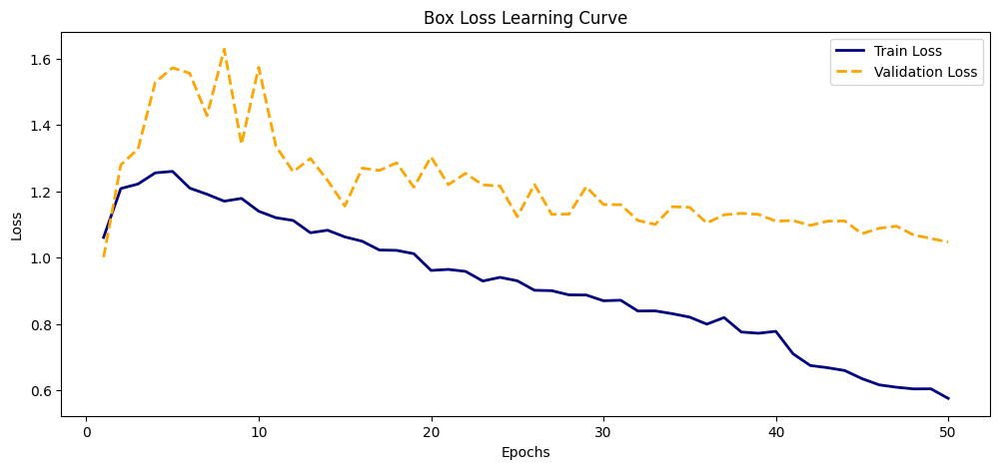

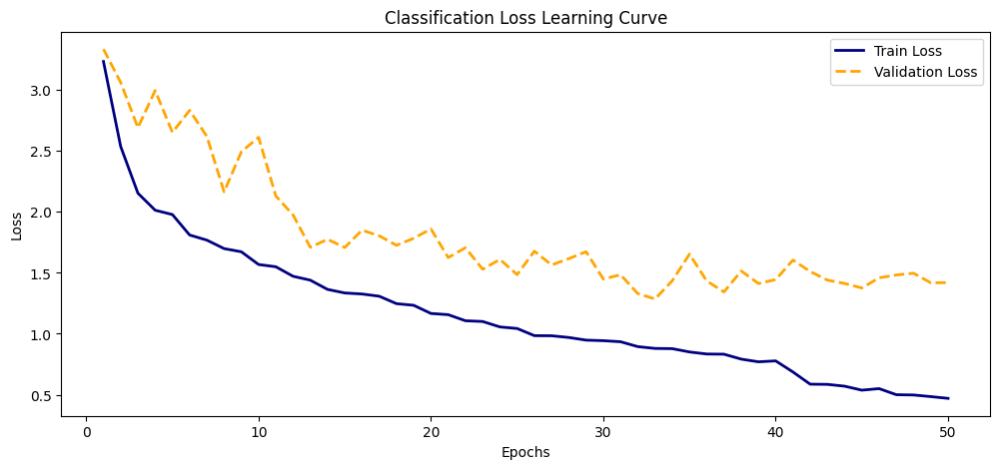

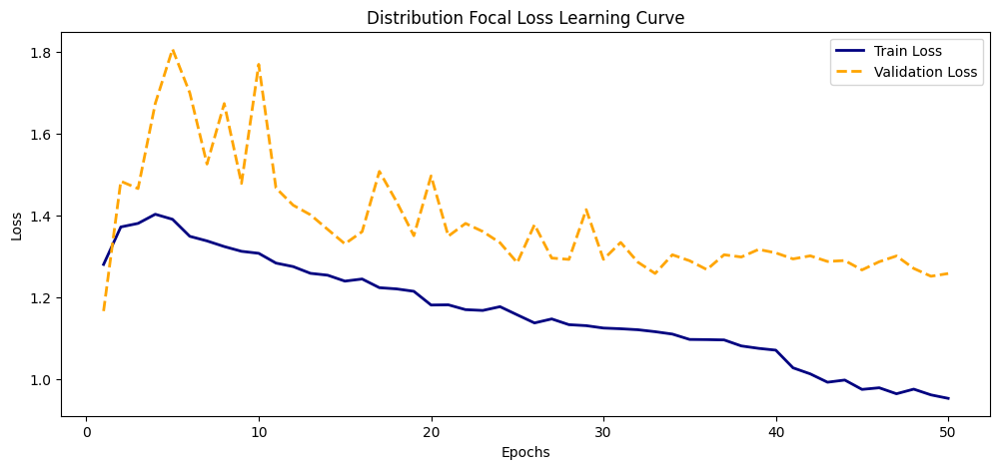

In [14]:
results_csv_path = os.path.join(post_training_files_path, 'results.csv')

df = pd.read_csv(results_csv_path)

df.columns = df.columns.str.strip()

plot_learning_curve(df, 'train/box_loss', 'val/box_loss', 'Box Loss Learning Curve')
plot_learning_curve(df, 'train/cls_loss', 'val/cls_loss', 'Classification Loss Learning Curve')
plot_learning_curve(df, 'train/dfl_loss', 'val/dfl_loss', 'Distribution Focal Loss Learning Curve')

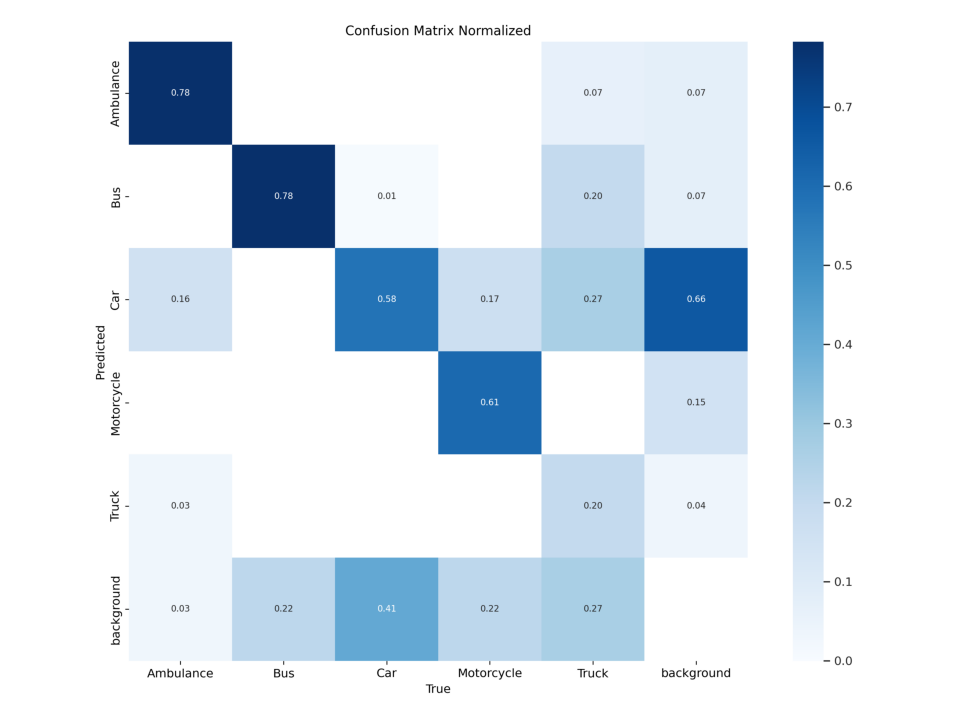

In [15]:
confusion_matrix_path = os.path.join(post_training_files_path, 'confusion_matrix_normalized.png')

cm_img = cv2.imread(confusion_matrix_path)

cm_img = cv2.cvtColor(cm_img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 10), dpi=120)
plt.imshow(cm_img)
plt.axis('off') 
plt.show()



In [16]:
best_model_path_yolo_detect = os.path.join(post_training_files_path, 'weights/best.pt')

best_model_yolo_detect = YOLO(best_model_path_yolo_detect)

metrics_yolo_detect = best_model_yolo_detect.val(split='val')

Ultralytics 8.3.130 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11n summary (fused): 100 layers, 2,583,127 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 54.6±16.3 MB/s, size: 31.0 KB)


val: Scanning /kaggle/input/vehicledetection/VehiclesDetectionDataset/valid/labels... 250 images, 0 backgrounds, 0 corrupt: 100%|██████████| 250/250 [00:00<00:00, 815.48it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/vehicledetection/VehiclesDetectionDataset/valid is not writeable, cache not saved.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:02<00:00,  7.04it/s]


                   all        250        454      0.748      0.518      0.636       0.47
             Ambulance         50         64       0.83      0.761      0.856      0.732
                   Bus         30         46      0.764      0.609      0.714      0.561
                   Car         90        238      0.682      0.454      0.527       0.37
            Motorcycle         42         46       0.72      0.565      0.653      0.412
                 Truck         38         60      0.743        0.2      0.431      0.273
Speed: 0.5ms preprocess, 1.9ms inference, 0.0ms loss, 2.8ms postprocess per image
Results saved to runs/detect/val


In [17]:
m50, m5095 = metrics_yolo_detect.box.map50, metrics_yolo_detect.box.map
print(f"Baseline ➜ mAP50 {m50:.3f} | mAP50-95 {m5095:.3f}")

Baseline ➜ mAP50 0.636 | mAP50-95 0.470


## Обучение YOLOv8s с заморозкой слоёв

Для повышения точности и стабильности на небольшом объёме данных использовалась модель **YOLOv8s** — более мощная, чем YOLOv8n, но всё ещё быстрая и компактная.

### ⚙️ Параметры обучения:

- **Модель**: `YOLOv8s` (файл `yolo11s.pt`)
- **Epochs**: `50`
- **Image Size**: `416×416`
- **Batch Size**: `8` — уменьшен по сравнению с предыдущей моделью из-за увеличенной архитектуры.
- **Optimizer**: автоматический подбор (`'auto'`)
- **Learning Rate**: `lr0 = 0.0001` — меньшая начальная скорость для более точного обучения
- **LR Final Factor**: `lrf = 0.1` — нижняя граница learning rate по косинусной схеме
- **Dropout**: `0.3` — регуляризация для предотвращения переобучения
- **Freeze**: `15` — первые 15 слоёв модели заморожены и не обучаются. Это позволяет:
  - сохранить предобученные признаки;
  - уменьшить переобучение;
  - ускорить сходимость на ограниченных данных.
- **Device**: `0` (GPU)
- **Patience**: `150` — ранняя остановка при отсутствии улучшения



In [18]:
model = YOLO("yolo11s.pt")

100%|██████████| 18.4M/18.4M [00:00<00:00, 143MB/s] 


In [19]:
results = model.train(
    data=yaml_file_path,     
    epochs=50,              
    imgsz=416,               
    device=0,                
    patience=150,             
    batch=8,                
    optimizer='auto',        
    lr0=0.0001,              
    lrf=0.1,                 
    dropout=0.3,             
    freeze=15,               
    seed=0                   
)

Ultralytics 8.3.130 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/input/vehicledetection/VehiclesDetectionDataset/dataset.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.3, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=15, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=416, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.1, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=150, pe

train: Scanning /kaggle/input/vehicledetection/VehiclesDetectionDataset/train/labels... 878 images, 0 backgrounds, 0 corrupt: 100%|██████████| 878/878 [00:01<00:00, 805.88it/s]

WARNING ⚠️ train: Cache directory /kaggle/input/vehicledetection/VehiclesDetectionDataset/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 60.9±11.6 MB/s, size: 33.0 KB)


val: Scanning /kaggle/input/vehicledetection/VehiclesDetectionDataset/valid/labels... 250 images, 0 backgrounds, 0 corrupt: 100%|██████████| 250/250 [00:00<00:00, 567.47it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/vehicledetection/VehiclesDetectionDataset/valid is not writeable, cache not saved.


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 416 train, 416 val
Using 4 dataloader workers
Logging results to runs/detect/train2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50     0.574G      1.027      1.796       1.25         25        416: 100%|██████████| 110/110 [00:09<00:00, 11.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00,  9.73it/s]

                   all        250        454      0.531      0.578       0.53      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50     0.713G      1.102      1.429      1.265         22        416: 100%|██████████| 110/110 [00:08<00:00, 13.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.48it/s]

                   all        250        454      0.568      0.612      0.639      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50     0.715G      1.161      1.376      1.296         36        416: 100%|██████████| 110/110 [00:08<00:00, 13.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.26it/s]

                   all        250        454      0.649      0.613      0.658      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50     0.715G      1.158       1.32      1.284         30        416: 100%|██████████| 110/110 [00:08<00:00, 13.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.53it/s]

                   all        250        454      0.648      0.587      0.647      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50     0.715G      1.111      1.255      1.263         22        416: 100%|██████████| 110/110 [00:08<00:00, 13.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.52it/s]

                   all        250        454      0.627      0.702      0.669      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50     0.715G      1.043      1.213      1.223         28        416: 100%|██████████| 110/110 [00:08<00:00, 13.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.55it/s]

                   all        250        454      0.673      0.691      0.691      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50     0.715G      1.059      1.155      1.245          9        416: 100%|██████████| 110/110 [00:08<00:00, 13.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.48it/s]

                   all        250        454       0.85      0.559      0.708      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50     0.715G      1.049      1.162      1.229         16        416: 100%|██████████| 110/110 [00:08<00:00, 13.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.48it/s]

                   all        250        454      0.693      0.631      0.657      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50     0.715G      1.029      1.108      1.218         14        416: 100%|██████████| 110/110 [00:08<00:00, 13.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.38it/s]

                   all        250        454      0.639       0.68      0.692      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50     0.715G      1.017      1.079      1.194         15        416: 100%|██████████| 110/110 [00:08<00:00, 13.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.45it/s]

                   all        250        454      0.688       0.57      0.678      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50     0.797G      1.006      1.071      1.202         29        416: 100%|██████████| 110/110 [00:08<00:00, 13.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.43it/s]

                   all        250        454      0.648      0.686      0.702      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50     0.797G     0.9638      1.054      1.199         15        416: 100%|██████████| 110/110 [00:08<00:00, 13.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.41it/s]

                   all        250        454      0.603      0.672      0.672      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50     0.797G     0.9523      1.014       1.16         24        416: 100%|██████████| 110/110 [00:08<00:00, 13.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.26it/s]

                   all        250        454      0.679      0.675      0.688      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50     0.797G      0.947     0.9718      1.161         24        416: 100%|██████████| 110/110 [00:08<00:00, 13.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.59it/s]

                   all        250        454      0.705      0.642      0.688      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50     0.797G     0.9187     0.9714      1.154         29        416: 100%|██████████| 110/110 [00:08<00:00, 13.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.60it/s]

                   all        250        454      0.643      0.695      0.707      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50     0.797G     0.8934     0.9289      1.146          8        416: 100%|██████████| 110/110 [00:08<00:00, 13.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.37it/s]

                   all        250        454      0.754      0.625       0.68      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50     0.797G     0.8914     0.9513      1.145         23        416: 100%|██████████| 110/110 [00:08<00:00, 13.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.57it/s]

                   all        250        454      0.728      0.653      0.697      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50     0.797G     0.8742     0.8993      1.123         27        416: 100%|██████████| 110/110 [00:08<00:00, 13.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.51it/s]

                   all        250        454      0.717      0.707       0.69      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50     0.797G     0.8813     0.8832      1.129         22        416: 100%|██████████| 110/110 [00:08<00:00, 13.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.25it/s]

                   all        250        454      0.673      0.651      0.688      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50     0.797G     0.8726     0.8653      1.134         22        416: 100%|██████████| 110/110 [00:08<00:00, 13.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.70it/s]

                   all        250        454      0.688      0.648      0.687      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50     0.797G     0.8677     0.8825      1.121         25        416: 100%|██████████| 110/110 [00:08<00:00, 13.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.53it/s]

                   all        250        454       0.72      0.663      0.729      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50     0.797G     0.8674      0.859      1.121         20        416: 100%|██████████| 110/110 [00:08<00:00, 13.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.61it/s]

                   all        250        454      0.688      0.695      0.705      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50     0.797G     0.8342     0.8535        1.1         18        416: 100%|██████████| 110/110 [00:08<00:00, 13.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.47it/s]

                   all        250        454      0.657      0.681      0.689      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50     0.797G     0.8512     0.8465      1.116         14        416: 100%|██████████| 110/110 [00:08<00:00, 13.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.54it/s]

                   all        250        454      0.632      0.656       0.67       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50     0.797G     0.7987     0.8226      1.086         24        416: 100%|██████████| 110/110 [00:08<00:00, 13.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.35it/s]

                   all        250        454      0.689      0.622      0.677      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50     0.797G     0.7995     0.7954      1.084         25        416: 100%|██████████| 110/110 [00:08<00:00, 13.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.56it/s]

                   all        250        454      0.701      0.663      0.675      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50     0.797G     0.8088     0.7723      1.078         19        416: 100%|██████████| 110/110 [00:08<00:00, 13.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.67it/s]

                   all        250        454      0.654      0.659      0.685        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50     0.797G     0.7944     0.7765      1.076         17        416: 100%|██████████| 110/110 [00:08<00:00, 13.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.47it/s]

                   all        250        454      0.712      0.695      0.689      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50     0.797G     0.7988     0.7646      1.085         32        416: 100%|██████████| 110/110 [00:08<00:00, 13.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.44it/s]

                   all        250        454      0.598      0.723      0.657      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50     0.797G     0.7697     0.7523      1.069         21        416: 100%|██████████| 110/110 [00:08<00:00, 13.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.43it/s]

                   all        250        454      0.635      0.688      0.671      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50     0.797G      0.762     0.7547      1.066         31        416: 100%|██████████| 110/110 [00:08<00:00, 13.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.53it/s]

                   all        250        454      0.653      0.686      0.669      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50     0.797G     0.7622     0.7557      1.066         20        416: 100%|██████████| 110/110 [00:08<00:00, 13.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.61it/s]

                   all        250        454      0.763      0.576      0.675      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50     0.797G      0.774     0.7184      1.064         16        416: 100%|██████████| 110/110 [00:08<00:00, 13.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.55it/s]

                   all        250        454      0.651       0.64      0.655      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50     0.797G      0.762     0.7194      1.066         24        416: 100%|██████████| 110/110 [00:08<00:00, 13.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.67it/s]

                   all        250        454      0.684      0.623      0.668      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50     0.797G     0.7437     0.6875      1.054         16        416: 100%|██████████| 110/110 [00:08<00:00, 13.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.24it/s]

                   all        250        454      0.644      0.691      0.668      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50     0.797G     0.7297     0.6852      1.051         21        416: 100%|██████████| 110/110 [00:08<00:00, 13.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.41it/s]

                   all        250        454      0.624      0.691      0.661      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50     0.797G     0.7501     0.6988      1.068         29        416: 100%|██████████| 110/110 [00:08<00:00, 13.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.62it/s]

                   all        250        454      0.693      0.665      0.667       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50     0.797G     0.7229     0.6766      1.049         17        416: 100%|██████████| 110/110 [00:08<00:00, 13.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.05it/s]

                   all        250        454      0.672      0.687      0.687      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50     0.797G     0.7303     0.7024       1.06         23        416: 100%|██████████| 110/110 [00:08<00:00, 13.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.81it/s]

                   all        250        454      0.711      0.603      0.654      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50     0.797G     0.7133     0.6736      1.041         12        416: 100%|██████████| 110/110 [00:08<00:00, 13.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.55it/s]

                   all        250        454      0.742      0.632      0.686      0.517


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50     0.797G     0.6096     0.5158     0.9814         12        416: 100%|██████████| 110/110 [00:08<00:00, 13.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.36it/s]

                   all        250        454      0.623        0.7      0.672      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50     0.797G     0.5893     0.4726     0.9662          9        416: 100%|██████████| 110/110 [00:08<00:00, 13.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.57it/s]

                   all        250        454      0.725      0.615      0.693      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50     0.797G     0.5896     0.4601     0.9578         16        416: 100%|██████████| 110/110 [00:07<00:00, 13.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.71it/s]

                   all        250        454      0.786      0.616      0.705      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50     0.797G     0.5647     0.4424     0.9636          8        416: 100%|██████████| 110/110 [00:07<00:00, 13.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.53it/s]

                   all        250        454      0.694      0.663      0.693      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50     0.797G     0.5639     0.4288     0.9487         11        416: 100%|██████████| 110/110 [00:08<00:00, 13.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.61it/s]

                   all        250        454      0.713      0.646      0.691      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50     0.797G     0.5669      0.423     0.9498         13        416: 100%|██████████| 110/110 [00:07<00:00, 13.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.61it/s]

                   all        250        454      0.738      0.674      0.708      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50     0.797G     0.5402     0.4137     0.9446         12        416: 100%|██████████| 110/110 [00:07<00:00, 13.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.27it/s]

                   all        250        454      0.699      0.681      0.708      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50     0.797G      0.533     0.3998     0.9373          9        416: 100%|██████████| 110/110 [00:08<00:00, 13.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.43it/s]

                   all        250        454      0.702      0.659      0.704      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50     0.797G     0.5399      0.413     0.9416         16        416: 100%|██████████| 110/110 [00:07<00:00, 13.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.41it/s]

                   all        250        454      0.732      0.672      0.699      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50     0.797G     0.5248     0.3907     0.9354         12        416: 100%|██████████| 110/110 [00:07<00:00, 13.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:01<00:00, 10.63it/s]

                   all        250        454      0.754      0.671       0.71      0.539



50 epochs completed in 0.139 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 19.1MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 19.1MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.130 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11s summary (fused): 100 layers, 9,414,735 parameters, 0 gradients, 21.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:02<00:00,  7.25it/s]


                   all        250        454      0.719      0.663      0.728      0.546
             Ambulance         50         64      0.734      0.875      0.879      0.728
                   Bus         30         46      0.681      0.783      0.799      0.663
                   Car         90        238      0.647      0.513      0.599      0.411
            Motorcycle         42         46      0.772      0.913      0.808       0.53
                 Truck         38         60       0.76      0.233      0.556      0.398
Speed: 0.1ms preprocess, 2.4ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs/detect/train2


In [20]:
post_training_files_path = '/kaggle/working/runs/detect/train'

!ls {post_training_files_path}

args.yaml			 R_curve.png	      train_batch2.jpg
confusion_matrix_normalized.png  results.csv	      val_batch0_labels.jpg
confusion_matrix.png		 results.png	      val_batch0_pred.jpg
F1_curve.png			 train_batch0.jpg     val_batch1_labels.jpg
labels_correlogram.jpg		 train_batch1120.jpg  val_batch1_pred.jpg
labels.jpg			 train_batch1121.jpg  val_batch2_labels.jpg
P_curve.png			 train_batch1122.jpg  val_batch2_pred.jpg
PR_curve.png			 train_batch1.jpg     weights


In [21]:
def plot_learning_curve(df, train_loss_col, val_loss_col, title):
    plt.figure(figsize=(12, 5))
    sns.lineplot(data=df, x='epoch', y=train_loss_col, label='Train Loss', color='navy', linestyle='-', linewidth=2)
    sns.lineplot(data=df, x='epoch', y=val_loss_col, label='Validation Loss', color='green', linestyle='--', linewidth=2)
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

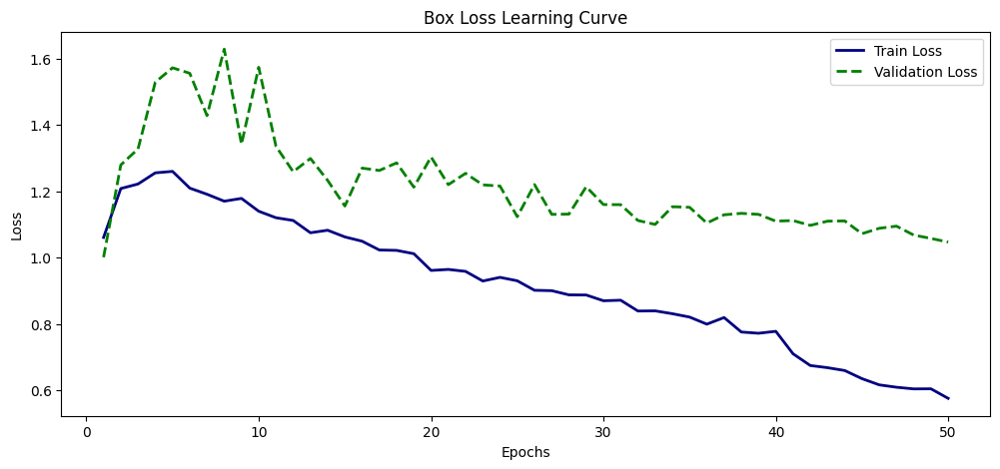

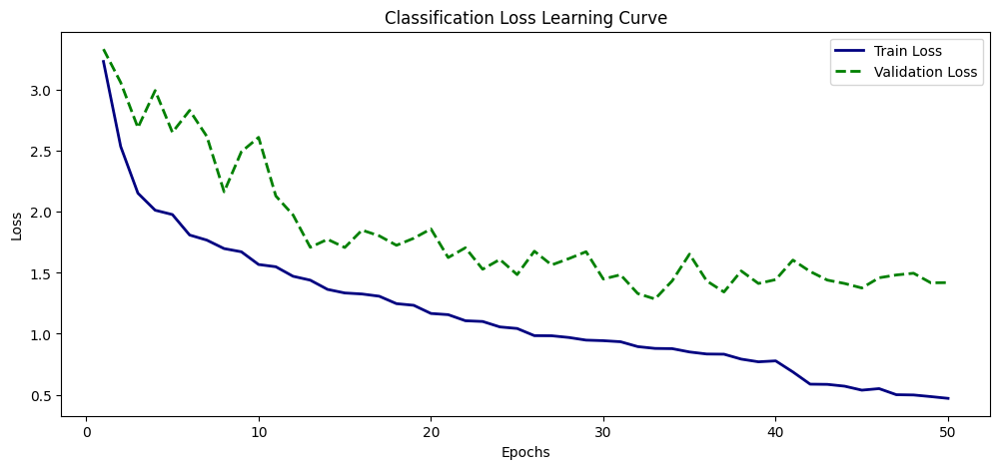

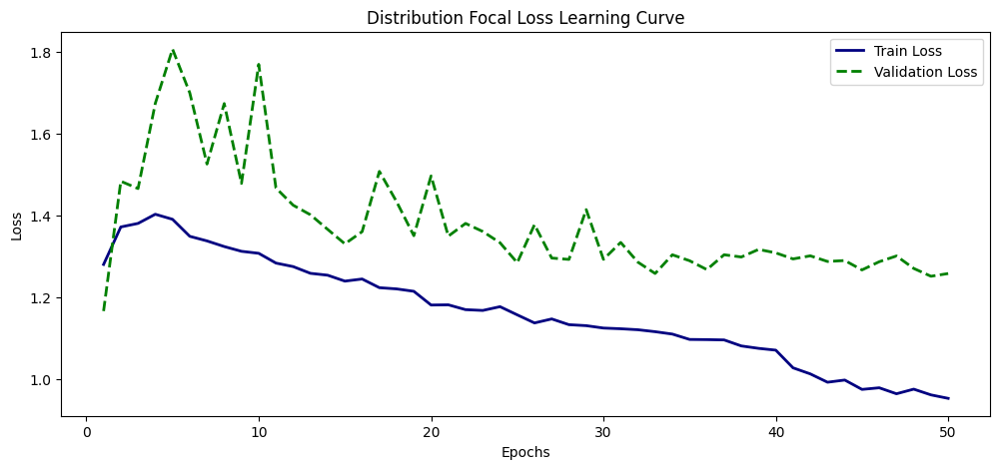

In [22]:
results_csv_path = os.path.join(post_training_files_path, 'results.csv')

df = pd.read_csv(results_csv_path)

df.columns = df.columns.str.strip()

plot_learning_curve(df, 'train/box_loss', 'val/box_loss', 'Box Loss Learning Curve')
plot_learning_curve(df, 'train/cls_loss', 'val/cls_loss', 'Classification Loss Learning Curve')
plot_learning_curve(df, 'train/dfl_loss', 'val/dfl_loss', 'Distribution Focal Loss Learning Curve')

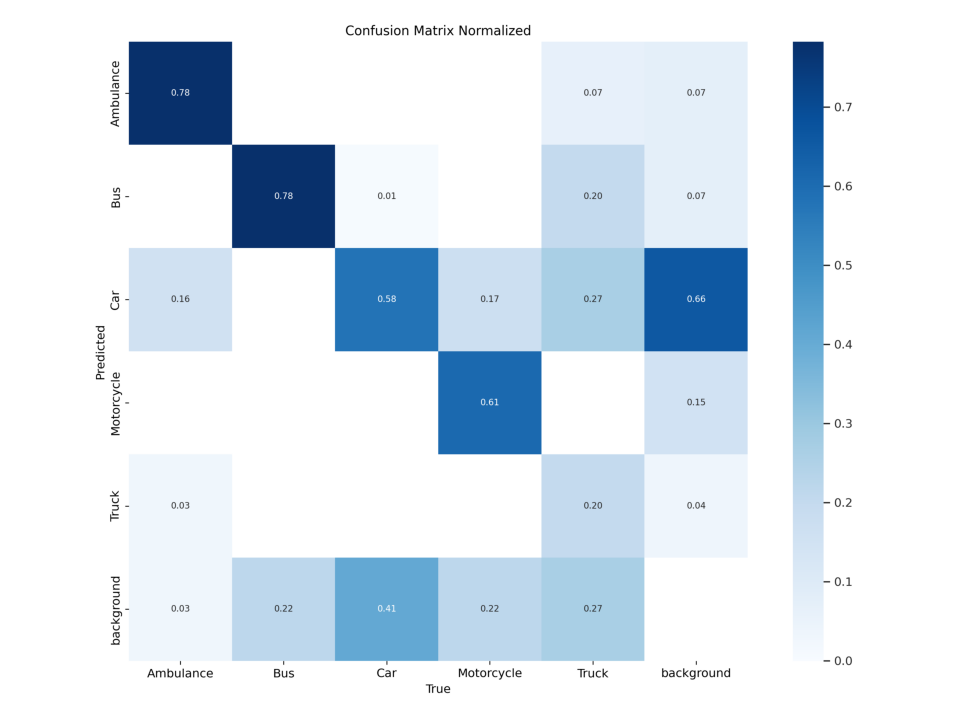

In [23]:
confusion_matrix_path = os.path.join(post_training_files_path, 'confusion_matrix_normalized.png')

cm_img = cv2.imread(confusion_matrix_path)

cm_img = cv2.cvtColor(cm_img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 10), dpi=120)
plt.imshow(cm_img)
plt.axis('off') 
plt.show()


In [24]:
best_model_path_yolo_detect = os.path.join(post_training_files_path, 'weights/best.pt')

best_model_yolo_detect = YOLO(best_model_path_yolo_detect)

metrics_yolo_detect = best_model_yolo_detect.val(split='val')

Ultralytics 8.3.130 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11n summary (fused): 100 layers, 2,583,127 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 54.4±11.4 MB/s, size: 31.0 KB)


val: Scanning /kaggle/input/vehicledetection/VehiclesDetectionDataset/valid/labels... 250 images, 0 backgrounds, 0 corrupt: 100%|██████████| 250/250 [00:00<00:00, 817.95it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/vehicledetection/VehiclesDetectionDataset/valid is not writeable, cache not saved.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:02<00:00,  7.13it/s]


                   all        250        454      0.748      0.518      0.636       0.47
             Ambulance         50         64       0.83      0.761      0.856      0.732
                   Bus         30         46      0.764      0.609      0.714      0.561
                   Car         90        238      0.682      0.454      0.527       0.37
            Motorcycle         42         46       0.72      0.565      0.653      0.412
                 Truck         38         60      0.743        0.2      0.431      0.273
Speed: 0.6ms preprocess, 1.8ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to runs/detect/val2


In [25]:
m50, m5095 = metrics_yolo_detect.box.map50, metrics_yolo_detect.box.map
print(f"Upgrade ➜ mAP50 {m50:.3f} | mAP50-95 {m5095:.3f}")

Upgrade ➜ mAP50 0.636 | mAP50-95 0.470



image 1/1 /kaggle/input/vehicledetection/VehiclesDetectionDataset/test/images/a3cffcdbff959432_jpg.rf.4MQ1NmvMx33nwLe9QSvu.jpg: 416x416 1 Truck, 8.3ms
Speed: 2.0ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/vehicledetection/VehiclesDetectionDataset/test/images/a7674f15d9b1f35f_jpg.rf.pL09u0Oz8DRvTB3AnBXT.jpg: 416x416 1 Ambulance, 8.6ms
Speed: 1.3ms preprocess, 8.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/vehicledetection/VehiclesDetectionDataset/test/images/aed83d879a22a6c4_jpg.rf.ada6c87c88d32689f79e3a03c9ebd314.jpg: 416x416 (no detections), 10.3ms
Speed: 1.3ms preprocess, 10.3ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/vehicledetection/VehiclesDetectionDataset/test/images/a3cffcdbff959432_jpg.rf.1f1f8cfcdfe052a8ec72e63b11889b66.jpg: 416x416 1 Truck, 9.1ms
Speed: 0.7ms preprocess, 9.1ms inference, 1.4ms postprocess per im

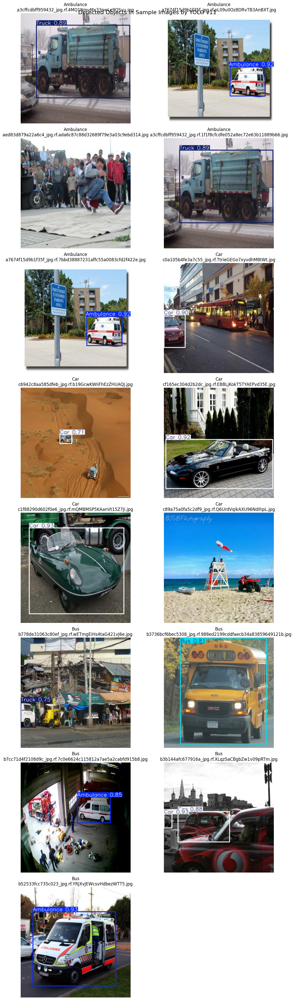

In [26]:
best_model = YOLO("/kaggle/working/runs/detect/train/weights/best.pt")  # Update with your model path

test_images_path = Path("/kaggle/input/vehicledetection/VehiclesDetectionDataset/test/images")

class_mapping = {
    "A": "Ambulance",
    "C": "Car",
    "M": "Motorcycle",
    "B": "Bus",
    "T": "Truck"
}

image_classes = {cls: [] for cls in class_mapping.keys()}

if not test_images_path.exists():
    raise FileNotFoundError(f"Error: The path {test_images_path} does not exist!")

for img_name in os.listdir(test_images_path):
    if img_name.endswith(('.jpg', '.png', '.jpeg')):
        class_letter = img_name[0].upper()  
        if class_letter in image_classes:
            image_classes[class_letter].append(img_name)

selected_images = []
for class_letter, img_list in image_classes.items():
    selected_images.extend([(class_letter, img) for img in img_list[:5]])

if not selected_images:
    raise ValueError("No images were found matching the class mapping criteria. Check your filenames.")

num_images = len(selected_images)
num_rows = max(1, (num_images + 1) // 2)  

fig, axes = plt.subplots(num_rows, 2, figsize=(12, 5 * num_rows))

axes = axes.flatten() if num_images > 1 else [axes]

for idx, (class_letter, img_name) in enumerate(selected_images):
    img_path = test_images_path / img_name

    results = best_model.predict(source=str(img_path), imgsz=416, conf=0.7) 
    annotated_img = results[0].plot(line_width=2)

    annotated_img = cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB)

    axes[idx].imshow(annotated_img)
    axes[idx].set_title(f"{class_mapping[class_letter]}\n{img_name}", fontsize=12)
    axes[idx].axis("off")

for i in range(idx + 1, len(axes)):
    fig.delaxes(axes[i])

plt.suptitle("Detected Objects in Sample Images by YOLO v11", fontsize=16)
plt.tight_layout()
plt.show()


In [27]:
from ultralytics import RTDETR


## Обучение модели RT-DETR

В дополнение к YOLO была протестирована современная модель **RT-DETR (Real-Time DEtection TRansformer)** — трансформерная архитектура для детекции объектов, сочетающая высокую точность и эффективность.

### Параметры обучения:

- **Модель**: `RT-DETR` — архитектура на основе трансформеров, обеспечивает точную и одновременную детекцию всех объектов на изображении.
- **Epochs**: `50`
- **Image Size**: `416×416`
- **Batch Size**: `8`
- **Optimizer**: `auto` — автоматически подбирается наиболее подходящий оптимизатор.
- **Learning Rate**:
  - `lr0 = 0.0001` — начальное значение;
  - `lrf = 0.1` — косинусный спад learning rate.
- **Dropout**: `0.3` — регуляризация в модели.
- **Freeze**: `15` — замораживаются первые 15 слоёв, чтобы использовать предобученные признаки и дообучать только «голову» детектора.
- **Device**: `0` — используется GPU.
- **Patience**: `150` — ранняя остановка при отсутствии улучшения метрик.



In [28]:
model = RTDETR()

100%|██████████| 63.4M/63.4M [00:00<00:00, 118MB/s] 


In [29]:
results = model.train(
    data=yaml_file_path,     
    epochs=50,              
    imgsz=416,               
    device=0,                
    patience=150,             
    batch=8,                
    optimizer='auto',        
    lr0=0.0001,              
    lrf=0.1,                 
    dropout=0.3,             
    freeze=15,               
    seed=0                   
)

Ultralytics 8.3.130 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/input/vehicledetection/VehiclesDetectionDataset/dataset.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.3, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=15, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=416, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.1, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=rtdetr-l.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=150, p

train: Scanning /kaggle/input/vehicledetection/VehiclesDetectionDataset/train/labels... 878 images, 0 backgrounds, 0 corrupt: 100%|██████████| 878/878 [00:01<00:00, 699.92it/s]

WARNING ⚠️ train: Cache directory /kaggle/input/vehicledetection/VehiclesDetectionDataset/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 56.3±8.7 MB/s, size: 33.0 KB)


val: Scanning /kaggle/input/vehicledetection/VehiclesDetectionDataset/valid/labels... 250 images, 0 backgrounds, 0 corrupt: 100%|██████████| 250/250 [00:00<00:00, 623.47it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/vehicledetection/VehiclesDetectionDataset/valid is not writeable, cache not saved.


Plotting labels to runs/detect/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 143 weight(decay=0.0), 206 weight(decay=0.0005), 226 bias(decay=0.0)
Image sizes 416 train, 416 val
Using 4 dataloader workers
Logging results to runs/detect/train3
Starting training for 50 epochs...

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       1/50      2.95G     0.5484      4.182     0.4419         25        416: 100%|██████████| 110/110 [00:40<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.77it/s]


                   all        250        454      0.492      0.636      0.468      0.339

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       2/50      3.36G     0.4303     0.7517     0.3268         22        416: 100%|██████████| 110/110 [00:38<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.87it/s]


                   all        250        454      0.573      0.672      0.597      0.466

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       3/50      3.36G     0.4047      0.718     0.3107         36        416: 100%|██████████| 110/110 [00:38<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.88it/s]

                   all        250        454      0.729      0.653      0.623      0.488



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       4/50      3.36G     0.3869     0.7001     0.2882         30        416: 100%|██████████| 110/110 [00:37<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.82it/s]

                   all        250        454       0.72      0.679      0.669      0.529



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       5/50      3.36G     0.3545      0.705     0.2708         22        416: 100%|██████████| 110/110 [00:37<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.85it/s]

                   all        250        454      0.706      0.643      0.655      0.507



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       6/50      3.36G     0.3453     0.6567     0.2587         28        416: 100%|██████████| 110/110 [00:37<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.84it/s]

                   all        250        454        0.7      0.693      0.716      0.554



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       7/50      3.36G     0.3424     0.6429     0.2636          9        416: 100%|██████████| 110/110 [00:37<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.83it/s]

                   all        250        454      0.695      0.719      0.715      0.568



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       8/50      3.36G     0.3455     0.6328     0.2628         16        416: 100%|██████████| 110/110 [00:37<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.83it/s]

                   all        250        454      0.759      0.716      0.729      0.591



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       9/50      3.36G     0.3371     0.5906      0.259         14        416: 100%|██████████| 110/110 [00:37<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.80it/s]

                   all        250        454      0.689      0.721      0.711       0.56



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      10/50      3.36G      0.326      0.585     0.2511         15        416: 100%|██████████| 110/110 [00:37<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.83it/s]

                   all        250        454      0.731      0.765       0.75      0.597



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      11/50      3.36G     0.3244     0.5911     0.2434         29        416: 100%|██████████| 110/110 [00:37<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.82it/s]

                   all        250        454      0.679      0.723      0.672      0.536



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      12/50      3.36G     0.3017     0.5762     0.2456         15        416: 100%|██████████| 110/110 [00:37<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.82it/s]

                   all        250        454      0.733      0.765      0.732      0.577



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      13/50      3.36G     0.3032     0.5577     0.2294         24        416: 100%|██████████| 110/110 [00:37<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.84it/s]

                   all        250        454      0.732      0.723      0.714      0.554



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      14/50      3.36G     0.2966     0.5477     0.2213         24        416: 100%|██████████| 110/110 [00:37<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.84it/s]

                   all        250        454      0.749       0.72      0.727      0.572



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      15/50      3.36G     0.2874     0.5419      0.224         29        416: 100%|██████████| 110/110 [00:37<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.82it/s]

                   all        250        454      0.761      0.723      0.704      0.543



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      16/50      3.36G     0.2844     0.5362     0.2183          8        416: 100%|██████████| 110/110 [00:37<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.85it/s]

                   all        250        454      0.681      0.769      0.739      0.579



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      17/50      3.36G     0.2851     0.5445     0.2244         23        416: 100%|██████████| 110/110 [00:37<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.80it/s]

                   all        250        454      0.738       0.74      0.745      0.593



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      18/50      3.36G     0.2679     0.5173     0.2032         27        416: 100%|██████████| 110/110 [00:37<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.82it/s]

                   all        250        454      0.744      0.758      0.737      0.591



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      19/50      3.36G     0.2798     0.4954     0.2063         22        416: 100%|██████████| 110/110 [00:38<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.83it/s]

                   all        250        454      0.735      0.714      0.724      0.579



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      20/50      3.36G     0.2718     0.4955      0.209         22        416: 100%|██████████| 110/110 [00:37<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.83it/s]

                   all        250        454      0.796      0.689      0.739      0.578



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      21/50      3.36G      0.274     0.5016     0.2064         25        416: 100%|██████████| 110/110 [00:37<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.80it/s]


      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      22/50      3.36G     0.2752     0.4981     0.2078         20        416: 100%|██████████| 110/110 [00:37<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.82it/s]

                   all        250        454      0.708      0.772       0.74       0.58



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      25/50      3.36G     0.2492     0.4631     0.1881         24        416: 100%|██████████| 110/110 [00:37<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.81it/s]

                   all        250        454      0.779      0.736      0.737       0.58



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      26/50      3.36G     0.2487     0.4614     0.1913         25        416: 100%|██████████| 110/110 [00:37<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.83it/s]

                   all        250        454      0.714      0.752      0.722      0.561



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      27/50      3.36G     0.2626     0.4584     0.1809         19        416: 100%|██████████| 110/110 [00:37<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.81it/s]

                   all        250        454      0.758      0.742       0.74      0.577



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      28/50      3.36G     0.2551     0.4468     0.1871         17        416: 100%|██████████| 110/110 [00:38<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.82it/s]

                   all        250        454      0.735      0.763      0.743      0.587



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      29/50      3.36G      0.256     0.4452     0.1885         32        416: 100%|██████████| 110/110 [00:37<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.80it/s]

                   all        250        454       0.72      0.739      0.738      0.583



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      30/50      3.36G     0.2527     0.4385     0.1823         21        416: 100%|██████████| 110/110 [00:37<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.83it/s]

                   all        250        454      0.748       0.71      0.729       0.57



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      31/50      3.36G     0.2417     0.4308     0.1746         31        416: 100%|██████████| 110/110 [00:37<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.78it/s]

                   all        250        454      0.738      0.692      0.726      0.559



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      32/50      3.36G     0.2477     0.4357     0.1789         20        416: 100%|██████████| 110/110 [00:37<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.82it/s]

                   all        250        454      0.756      0.732      0.743      0.572



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      33/50      3.36G      0.241      0.425     0.1723         16        416: 100%|██████████| 110/110 [00:38<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.82it/s]

                   all        250        454      0.757      0.758      0.756      0.586



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      34/50      3.36G     0.2509     0.4195     0.1823         24        416: 100%|██████████| 110/110 [00:37<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.84it/s]

                   all        250        454       0.78      0.726      0.762      0.592



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      35/50      3.36G     0.2316     0.4078     0.1745         16        416: 100%|██████████| 110/110 [00:37<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.82it/s]

                   all        250        454      0.718      0.713      0.732      0.578



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      36/50      3.36G     0.2277      0.417       0.17         21        416: 100%|██████████| 110/110 [00:37<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.82it/s]

                   all        250        454      0.727      0.744      0.739      0.573



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      37/50      3.36G     0.2433     0.4112     0.1742         29        416: 100%|██████████| 110/110 [00:37<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.84it/s]

                   all        250        454      0.751       0.68       0.69      0.547



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      38/50      3.36G     0.2232     0.4186     0.1671         17        416: 100%|██████████| 110/110 [00:37<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.83it/s]

                   all        250        454      0.698       0.72      0.694      0.545



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      39/50      3.36G     0.2185     0.4063      0.173         23        416: 100%|██████████| 110/110 [00:37<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.80it/s]

                   all        250        454      0.727      0.676      0.713      0.557



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      40/50      3.36G     0.2287     0.3894     0.1672         12        416: 100%|██████████| 110/110 [00:37<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.81it/s]


                   all        250        454      0.759      0.688      0.727      0.564
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      41/50      3.36G     0.1727     0.2754     0.1262         12        416: 100%|██████████| 110/110 [00:38<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.78it/s]


                   all        250        454      0.761      0.724      0.738      0.578

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      42/50      3.36G     0.1619     0.2584     0.1112          9        416: 100%|██████████| 110/110 [00:37<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.80it/s]


                   all        250        454      0.797      0.701      0.738       0.58

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      43/50      3.36G     0.1582     0.2446     0.1102         16        416: 100%|██████████| 110/110 [00:37<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.82it/s]

                   all        250        454      0.742      0.725      0.744      0.586



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      44/50      3.36G     0.1564     0.2391     0.1125          8        416: 100%|██████████| 110/110 [00:37<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.84it/s]

                   all        250        454      0.765      0.697      0.739      0.586



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      45/50      3.36G     0.1501     0.2349     0.1073         11        416: 100%|██████████| 110/110 [00:37<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.80it/s]


                   all        250        454      0.752      0.715      0.736       0.58

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      46/50      3.36G     0.1523     0.2434     0.1073         13        416: 100%|██████████| 110/110 [00:37<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.80it/s]

                   all        250        454      0.795      0.704      0.758      0.587



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      47/50      3.36G     0.1397     0.2334     0.0965         12        416: 100%|██████████| 110/110 [00:37<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.81it/s]

                   all        250        454      0.777      0.717      0.756        0.6



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      48/50      3.36G     0.1409     0.2269    0.09663          9        416: 100%|██████████| 110/110 [00:37<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.80it/s]


                   all        250        454      0.815      0.698      0.752      0.596

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      49/50      3.36G     0.1427     0.2337    0.09988         16        416: 100%|██████████| 110/110 [00:37<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.79it/s]

                   all        250        454      0.776      0.723       0.75      0.592



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      50/50      3.36G     0.1405     0.2298    0.09755         12        416: 100%|██████████| 110/110 [00:37<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.79it/s]

                   all        250        454        0.8      0.713      0.745      0.589



50 epochs completed in 0.587 hours.
Optimizer stripped from runs/detect/train3/weights/last.pt, 66.2MB
Optimizer stripped from runs/detect/train3/weights/best.pt, 66.2MB

Validating runs/detect/train3/weights/best.pt...
Ultralytics 8.3.130 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
rt-detr-l summary: 302 layers, 31,994,015 parameters, 0 gradients, 103.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:03<00:00,  4.11it/s]


                   all        250        454      0.756      0.727      0.754      0.598
             Ambulance         50         64      0.763      0.906      0.909      0.801
                   Bus         30         46      0.758      0.826      0.824      0.713
                   Car         90        238      0.728      0.563       0.66      0.491
            Motorcycle         42         46      0.795      0.842      0.787      0.549
                 Truck         38         60      0.734        0.5      0.593      0.437
Speed: 0.1ms preprocess, 11.6ms inference, 0.0ms loss, 0.4ms postprocess per image
Results saved to runs/detect/train3


In [30]:
metrics_yolo_detect = model.val(split='val')

Ultralytics 8.3.130 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
rt-detr-l summary: 302 layers, 31,994,015 parameters, 0 gradients, 103.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 57.8±23.8 MB/s, size: 31.0 KB)


val: Scanning /kaggle/input/vehicledetection/VehiclesDetectionDataset/valid/labels... 250 images, 0 backgrounds, 0 corrupt: 100%|██████████| 250/250 [00:00<00:00, 622.27it/s]


WARNING ⚠️ val: Cache directory /kaggle/input/vehicledetection/VehiclesDetectionDataset/valid is not writeable, cache not saved.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:03<00:00,  8.30it/s]


                   all        250        454      0.763      0.728      0.755      0.601
             Ambulance         50         64      0.763      0.906      0.909      0.804
                   Bus         30         46      0.788      0.826      0.828      0.721
                   Car         90        238      0.733      0.563      0.655      0.489
            Motorcycle         42         46      0.795      0.842      0.789      0.554
                 Truck         38         60      0.737        0.5      0.592      0.437
Speed: 0.3ms preprocess, 11.8ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to runs/detect/train32


In [31]:
m50, m5095 = metrics_yolo_detect.box.map50, metrics_yolo_detect.box.map
print(f"DETR ➜ mAP50 {m50:.3f} | mAP50-95 {m5095:.3f}")

DETR ➜ mAP50 0.755 | mAP50-95 0.601
